Ref:/glade/u/home/prein/papers/2021_Object-Tracker-Intro/programs/plots/ClimatologicalAnalysis/ClimatologicalAnalysis.ipynb

In [4]:
import os
import datetime
import numpy as np
from netCDF4 import Dataset
import pandas as pd
from tqdm import tqdm
import string
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import cartopy 
import cartopy.crs as ccrs

#### setup input 

In [5]:
sPlotFile = '/glade/u/home/mingge/EURO-CORDEX/'
dir_0  = '/glade/campaign/mmm/c3we/mingge/FRONTIERS/data/ProcessIdentification/CORDEX/' 

res_TarGrid = '44'
res  = '44'

dir_i = dir_0 + 'TarGrid.'+ str(res_TarGrid)+ '/'+ 'EUR-'+ res +'/annual_feature_frequ/'

file = open('/glade/u/home/mingge/EURO-CORDEX/uniqueVar_?hr_'+ res +'.txt', 'r')
dataset = file.readlines()

nn = 0
for line in dataset:
       dataset[nn] = line.replace('\n', '')
       nn = nn + 1

n_ds = len(dataset)
n_ds

13

#### Read the netCDF file

In [6]:
flnm = '/glade/campaign/mmm/c3we/mingge/FRONTIERS/data/ProcessIdentification/CORDEX/TarGrid.'+ str(res_TarGrid)+ '/EUR-11/evaluation/ECMWF-ERAINT/r1i1p1/200001_ECMWF-ERAINT_evaluation_r1i1p1_MOHC-HadREM3-GA7-05_ObjectMasks_dt-3h_PRTr-2_PRS-0_ARt-9_ARL-2000_CYt-12_FRA-50000_CLS-0_CLT-241_CLt-4_CLA-40000_IVTTr-500_IVTt-9.nc' 
ncid = Dataset(flnm)
Lat=np.squeeze(ncid.variables['lat'][:])
Lon=np.squeeze(ncid.variables['lon'][:])
nx = Lon.shape[0]
ny = Lon.shape[1]
ncid.close()
print('grid is from ', flnm)

grid is from  /glade/campaign/mmm/c3we/mingge/FRONTIERS/data/ProcessIdentification/CORDEX/TarGrid.44/EUR-11/evaluation/ECMWF-ERAINT/r1i1p1/200001_ECMWF-ERAINT_evaluation_r1i1p1_MOHC-HadREM3-GA7-05_ObjectMasks_dt-3h_PRTr-2_PRS-0_ARt-9_ARL-2000_CYt-12_FRA-50000_CLS-0_CLT-241_CLt-4_CLA-40000_IVTTr-500_IVTt-9.nc


In [7]:
Objects = ['Cyclones','Anticyclones','Precipitation','Anviles','Fronts', 'AR', 'MS'] 
n_obj = len(Objects)

In [8]:
dataset

['ICHEC-EC-EARTH_historical_r12i1p1_CLMcom-CCLM5-0-6',
 'CNRM-CERFACS-CNRM-CM5_historical_r1i1p1_CLMcom-CCLM5-0-6',
 'MPI-M-MPI-ESM-LR_historical_r1i1p1_CLMcom-CCLM5-0-6',
 'MIROC-MIROC5_historical_r1i1p1_CLMcom-CCLM5-0-6',
 'MOHC-HadGEM2-ES_historical_r1i1p1_CLMcom-CCLM5-0-6',
 'ICHEC-EC-EARTH_rcp85_r12i1p1_CLMcom-CCLM5-0-6',
 'CNRM-CERFACS-CNRM-CM5_rcp85_r1i1p1_CLMcom-CCLM5-0-6',
 'MPI-M-MPI-ESM-LR_rcp85_r1i1p1_CLMcom-CCLM5-0-6',
 'MIROC-MIROC5_rcp85_r1i1p1_CLMcom-CCLM5-0-6',
 'MOHC-HadGEM2-ES_rcp85_r1i1p1_CLMcom-CCLM5-0-6',
 'ECMWF-ERAINT_evaluation_r1i1p1_CLMcom-CCLM5-0-6',
 'ECMWF-ERAINT_evaluation_r1i1p1_UCAN-WRF331G',
 'ECMWF-ERAINT_evaluation_r1i1p1_MOHC-HadGEM3-RA']

In [9]:
#annualObjectFrequency = np.zeros((len(Years), nx, ny, len(Objects)))
#annualObjectFrequency[:] = np.nan
days = 365

ObjectFrequency = np.zeros((n_ds, nx, ny, n_obj))
ObjectFrequency[:] = np.nan

nn_ds = 0
for ds in dataset:
    print(ds)
    flnm_tmp = ds + '.tmp'
    # ls  Sort entries alphabetically if none of -cftuvSUX nor --sort is specified.
    cmd_ls = 'ls -1 ' + dir_i + '*' + ds + '*.npz > ' + flnm_tmp
    os.system(cmd_ls)
    
    with open(flnm_tmp) as ff:
        flnm_t = ff.readlines()
        n_year = len(flnm_t)
        annualObjectFrequency = np.zeros((n_year, nx, ny, n_obj))
        annualObjectFrequency[:] = np.nan
        
        nn = 0
        for line in flnm_t:
            flnm_t[nn] = line.replace('\n', '')
            YYYY = flnm_t[nn].split('/')[-1][:4]
            #print(YYYY,nn, flnm_t[nn])
            
            try:
                flnm = flnm_t[nn].replace('\n', '')
            except:
                print('last line', nn)
                flnm = flnm_t[nn]
                 
            #print('---',flnm,'--')
            DATA = np.load(flnm)
            
            mean_cy = DATA['mean_cy']
            mean_acy = DATA['mean_acy']
            mean_pr = DATA['mean_pr']
            mean_anvil = DATA['mean_anvil']
            mean_fr = DATA['mean_fr']
            mean_ar = DATA['mean_ar']
            mean_ms =  DATA['mean_ms']
        
            #print('Collect the annual frequency of objects')
            annualObjectFrequency[nn,:,:,Objects.index('Cyclones')] = mean_cy
            annualObjectFrequency[nn,:,:,Objects.index('Anticyclones')] = mean_acy
            annualObjectFrequency[nn,:,:,Objects.index('Precipitation')] = mean_pr
            annualObjectFrequency[nn,:,:,Objects.index('Anviles')] = mean_anvil
            annualObjectFrequency[nn,:,:,Objects.index('Fronts')] = mean_fr
            annualObjectFrequency[nn,:,:,Objects.index('AR')] = mean_ar
            annualObjectFrequency[nn,:,:,Objects.index('MS')] = mean_ms

            nn = nn + 1
    # annual average
    ObjectFrequency[nn_ds] = np.nanmean(annualObjectFrequency, axis = 0)*days    
    nn_ds = nn_ds + 1   

ICHEC-EC-EARTH_historical_r12i1p1_CLMcom-CCLM5-0-6
CNRM-CERFACS-CNRM-CM5_historical_r1i1p1_CLMcom-CCLM5-0-6
MPI-M-MPI-ESM-LR_historical_r1i1p1_CLMcom-CCLM5-0-6
MIROC-MIROC5_historical_r1i1p1_CLMcom-CCLM5-0-6
MOHC-HadGEM2-ES_historical_r1i1p1_CLMcom-CCLM5-0-6
ICHEC-EC-EARTH_rcp85_r12i1p1_CLMcom-CCLM5-0-6
CNRM-CERFACS-CNRM-CM5_rcp85_r1i1p1_CLMcom-CCLM5-0-6
MPI-M-MPI-ESM-LR_rcp85_r1i1p1_CLMcom-CCLM5-0-6
MIROC-MIROC5_rcp85_r1i1p1_CLMcom-CCLM5-0-6
MOHC-HadGEM2-ES_rcp85_r1i1p1_CLMcom-CCLM5-0-6
ECMWF-ERAINT_evaluation_r1i1p1_CLMcom-CCLM5-0-6
ECMWF-ERAINT_evaluation_r1i1p1_UCAN-WRF331G
ECMWF-ERAINT_evaluation_r1i1p1_MOHC-HadGEM3-RA


Cyclones


/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'add_colorbar'
  result = super().contourf(*args, **kwargs)
/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


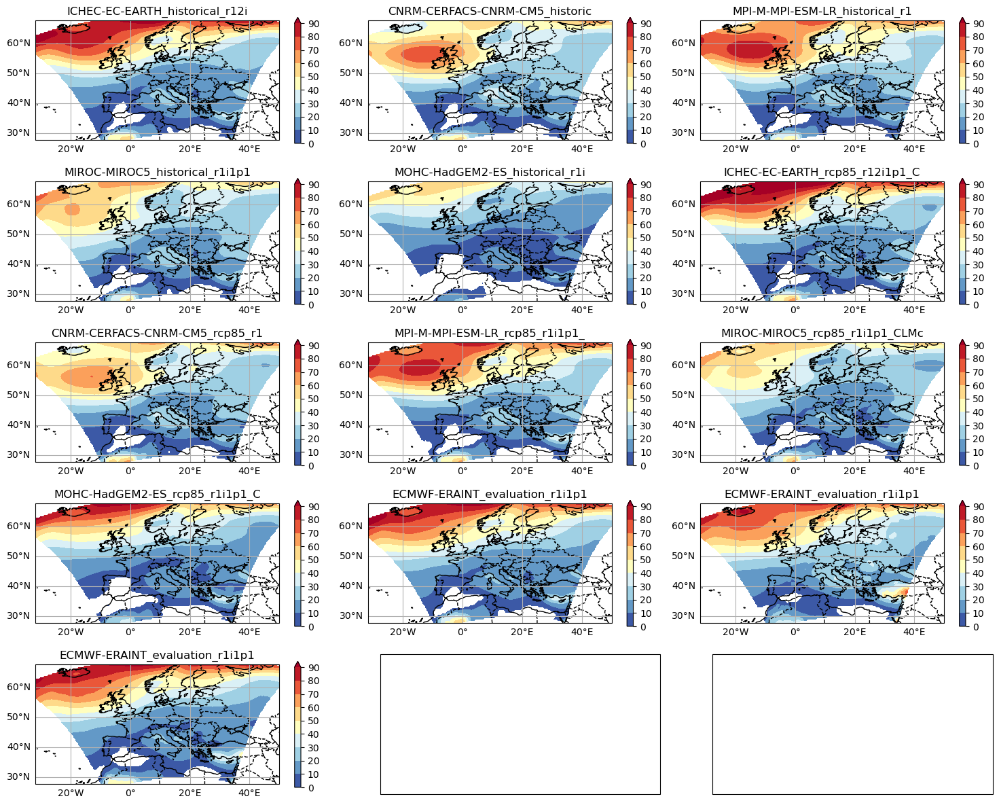

Anticyclones


/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'add_colorbar'
  result = super().contourf(*args, **kwargs)
/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


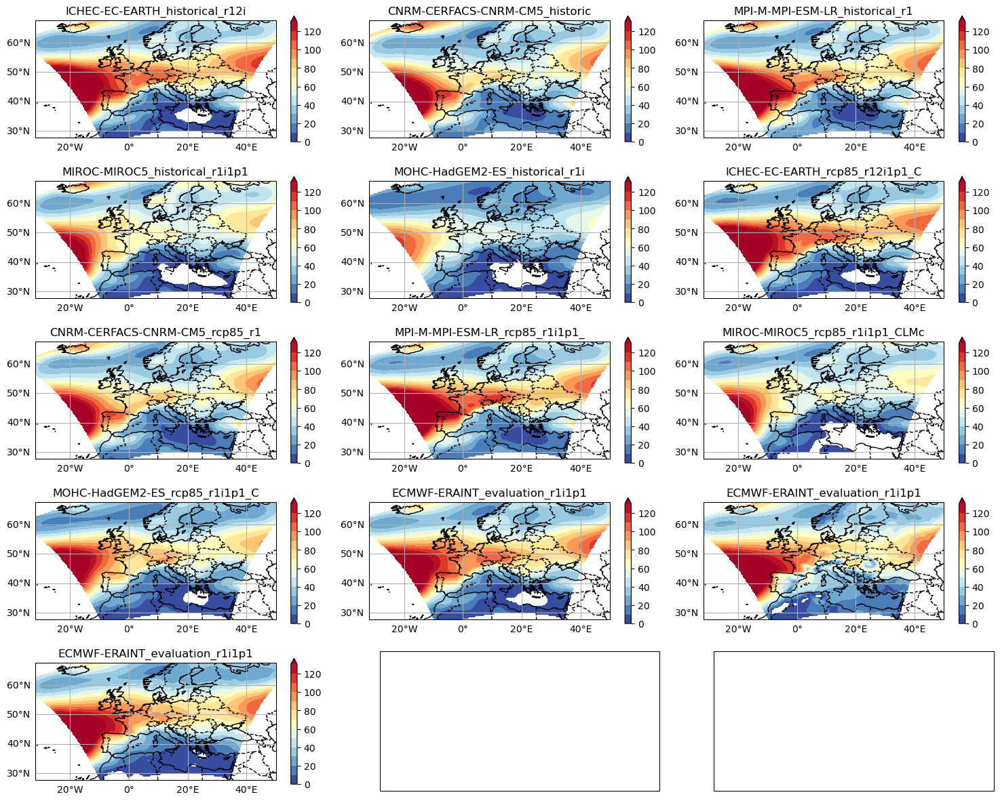

Precipitation


/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'add_colorbar'
  result = super().contourf(*args, **kwargs)
/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


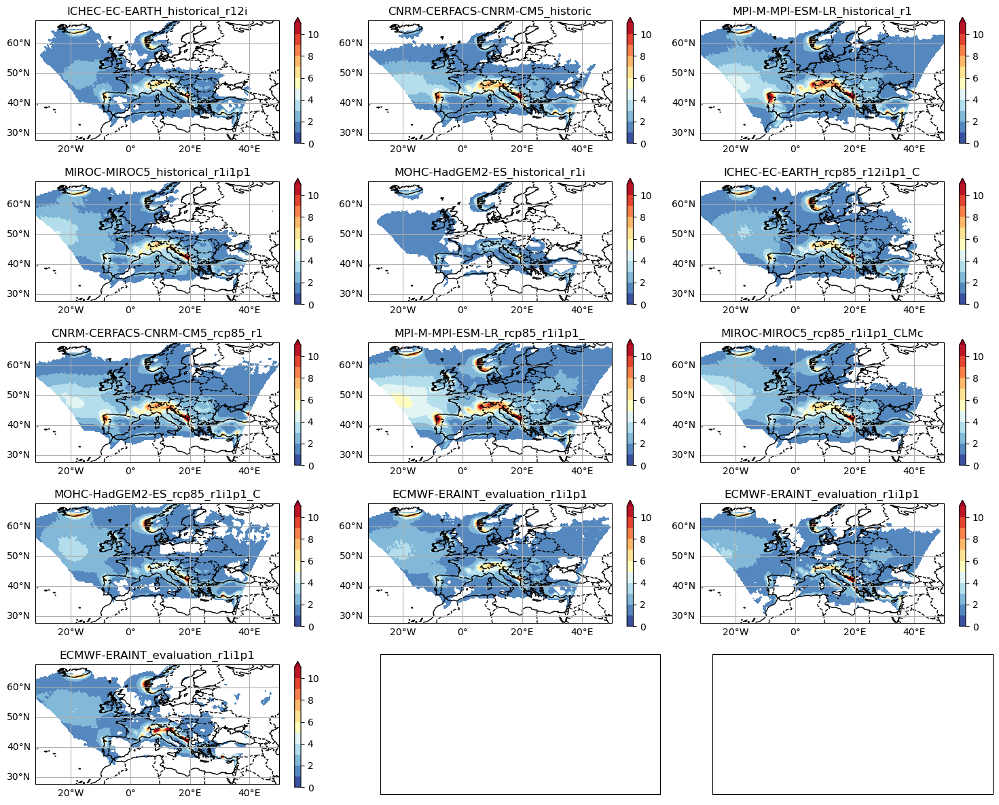

Anviles


/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'add_colorbar'
  result = super().contourf(*args, **kwargs)
/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


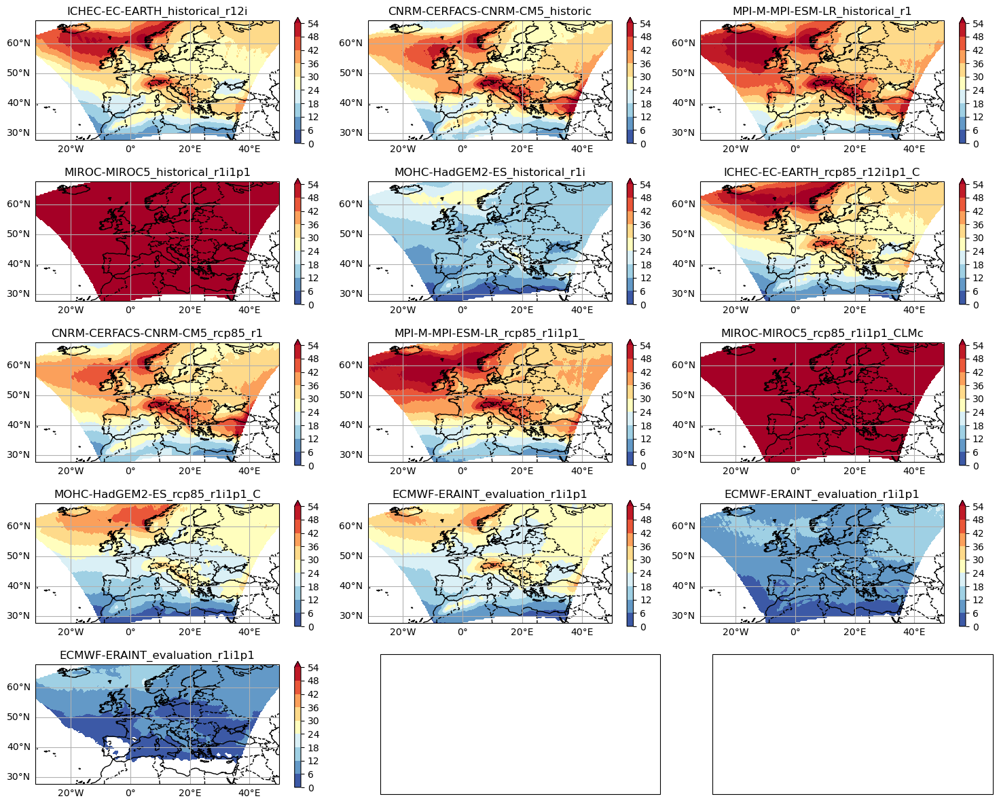

Fronts


/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'add_colorbar'
  result = super().contourf(*args, **kwargs)
/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


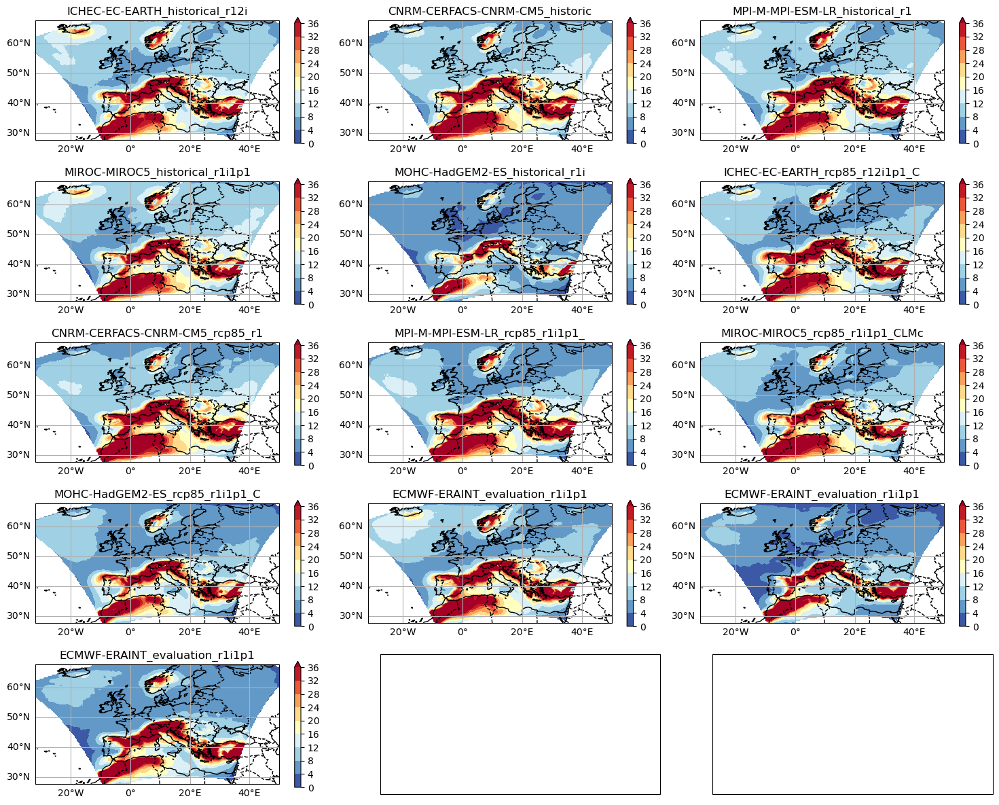

AR


/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'add_colorbar'
  result = super().contourf(*args, **kwargs)
/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


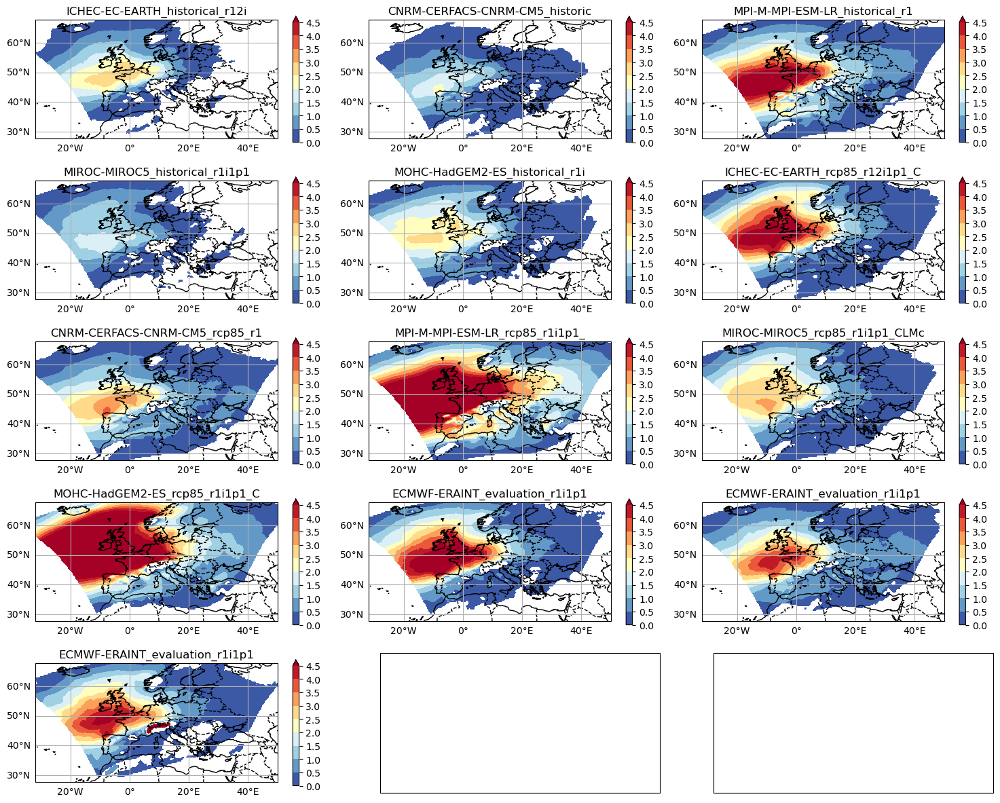

MS


/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'add_colorbar'
  result = super().contourf(*args, **kwargs)
/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


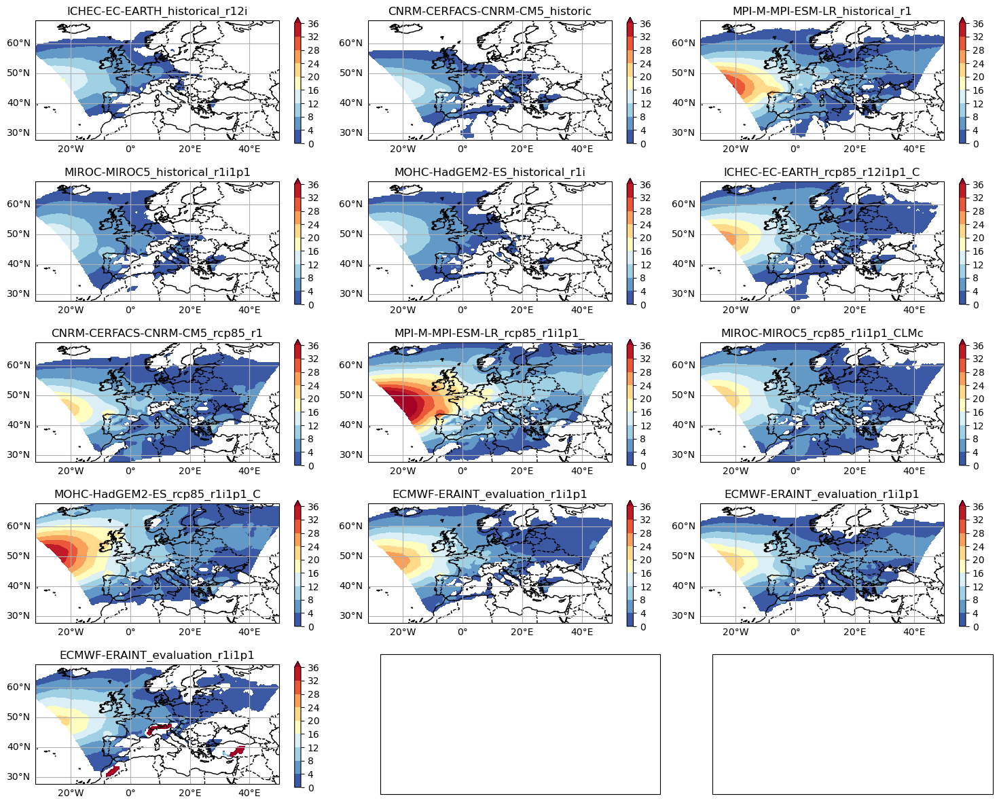

In [10]:
MIN     = [   4,         4,              1,            3,          1,    .1,   2]
Objects = ['Cyclones','Anticyclones','Precipitation','Anviles','Fronts','AR', 'MS'] 
level_s = [np.arange(0,100, 10), np.arange(0,140, 10), np.arange(0,12,1), np.arange(0, 60,6)
          ,np.arange(0,40,4),np.arange(0,5,0.5) ,np.arange(0, 40, 4)]
proj = ccrs.PlateCarree()

if res == '44':
    nrow = 5
    ncol = 3
    x_fig = 15
    y_fig = 12
if res == '11':
    nrow = 9
    ncol = 5
    x_fig = 15
    y_fig = 15    
    
for obj in range(n_obj):
    fig, ax = plt.subplots(nrow, ncol, subplot_kw={'projection': ccrs.PlateCarree()},figsize=(x_fig,y_fig))
    print(Objects[obj])
    for ds in range(n_ds):
        nr = int(ds/ncol)
        nc = int((ds%ncol))
        #print(ds,nr, nc)
        
        DATAse = ObjectFrequency[ds,:,:,Objects.index(Objects[obj])]
        DATAse[DATAse < MIN[obj]] = np.nan     
             
        im=ax[nr,nc].contourf(Lon, Lat, DATAse, transform=ccrs.PlateCarree(), 
                               add_colorbar=True,levels=level_s[obj],extend='max', cmap='RdYlBu_r')
        fig.colorbar(im, ax=ax[nr,nc], shrink=0.9)
        ax[nr,nc].coastlines()
        ax[nr,nc].add_feature(cartopy.feature.BORDERS, linestyle='--') 
        
        ax[nr][nc].set_title(dataset[ds][:30]) # fontweight='bold')#, color= 'blue')
        xl = ax[nr,nc].gridlines(draw_labels=True)  
        # remove axis label
        xl.xlabels_top = False
        xl.ylabels_right = False
         
    plt.savefig(Objects[obj] + '_' + res + '.pdf')  
    plt.tight_layout()
    plt.show()

#### grid .11

In [11]:
res  = '11'
dir_i = dir_0 + 'TarGrid.'+ str(res_TarGrid)+ '/'+ 'EUR-'+ res +'/annual_feature_frequ/'

file = open('/glade/u/home/mingge/EURO-CORDEX/uniqueVar_?hr_'+ res +'.txt', 'r')
dataset = file.readlines()

nn = 0
for line in dataset:
       dataset[nn] = line.replace('\n', '')
       nn = nn + 1

n_ds = len(dataset)
n_ds

43

In [22]:
#annualObjectFrequency = np.zeros((len(Years), nx, ny, len(Objects)))
#annualObjectFrequency[:] = np.nan
days = 365

ObjectFrequency = np.zeros((n_ds, nx, ny, n_obj))
ObjectFrequency[:] = np.nan

nn_ds = 0
for ds in dataset:
    print(ds)
    flnm_tmp = ds + '.tmp'
    # ls  Sort entries alphabetically if none of -cftuvSUX nor --sort is specified.
    cmd_ls = 'ls -1 ' + dir_i + '*' + ds + '*.npz > ' + flnm_tmp
    os.system(cmd_ls)
    
    with open(flnm_tmp) as ff:
        flnm_t = ff.readlines()
        n_year = len(flnm_t)
        annualObjectFrequency = np.zeros((n_year, nx, ny, n_obj))
        annualObjectFrequency[:] = np.nan
        
        nn = 0
        for line in flnm_t:
            flnm_t[nn] = line.replace('\n', '')
            YYYY = flnm_t[nn].split('/')[-1][:4]
            #print(YYYY,nn, flnm_t[nn])
            
            try:
                flnm = flnm_t[nn].replace('\n', '')
            except:
                print('last line', nn)
                flnm = flnm_t[nn]
                 
            #print('---',flnm,'--')
            DATA = np.load(flnm)
            
            mean_cy = DATA['mean_cy']
            mean_acy = DATA['mean_acy']
            mean_pr = DATA['mean_pr']
            mean_anvil = DATA['mean_anvil']
            mean_fr = DATA['mean_fr']
            mean_ar = DATA['mean_ar']
            mean_ms =  DATA['mean_ms']
        
            #print('Collect the annual frequency of objects')
            annualObjectFrequency[nn,:,:,Objects.index('Cyclones')] = mean_cy
            annualObjectFrequency[nn,:,:,Objects.index('Anticyclones')] = mean_acy
            annualObjectFrequency[nn,:,:,Objects.index('Precipitation')] = mean_pr
            annualObjectFrequency[nn,:,:,Objects.index('Anviles')] = mean_anvil
            annualObjectFrequency[nn,:,:,Objects.index('Fronts')] = mean_fr
            annualObjectFrequency[nn,:,:,Objects.index('AR')] = mean_ar
            annualObjectFrequency[nn,:,:,Objects.index('MS')] = mean_ms

            nn = nn + 1
    # annual average
    ObjectFrequency[nn_ds] = np.nanmean(annualObjectFrequency, axis = 0)*days    
    nn_ds = nn_ds + 1   

CCCma-CanESM2_historical_r1i1p1_CLMcom-CCLM4-8-17
ICHEC-EC-EARTH_historical_r1i1p1_CLMcom-ETH-COSMO-crCLIM-v1-1
ICHEC-EC-EARTH_historical_r3i1p1_CLMcom-ETH-COSMO-crCLIM-v1-1
ICHEC-EC-EARTH_historical_r12i1p1_CLMcom-ETH-COSMO-crCLIM-v1-1
ICHEC-EC-EARTH_historical_r12i1p1_ICTP-RegCM4-6
CNRM-CERFACS-CNRM-CM5_historical_r1i1p1_CNRM-ALADIN63
CNRM-CERFACS-CNRM-CM5_historical_r1i1p1_CLMcom-ETH-COSMO-crCLIM-v1-1
CNRM-CERFACS-CNRM-CM5_historical_r1i1p1_ICTP-RegCM4-6
MPI-M-MPI-ESM-LR_historical_r1i1p1_ICTP-RegCM4-6
MPI-M-MPI-ESM-LR_historical_r1i1p1_CNRM-ALADIN63
MPI-M-MPI-ESM-LR_historical_r1i1p1_CLMcom-ETH-COSMO-crCLIM-v1-1
MPI-M-MPI-ESM-LR_historical_r3i1p1_CLMcom-ETH-COSMO-crCLIM-v1-1
MPI-M-MPI-ESM-LR_historical_r2i1p1_CLMcom-ETH-COSMO-crCLIM-v1-1
MIROC-MIROC5_historical_r1i1p1_CLMcom-CCLM4-8-17
MOHC-HadGEM2-ES_historical_r1i1p1_CLMcom-ETH-COSMO-crCLIM-v1-1
MOHC-HadGEM2-ES_historical_r1i1p1_CNRM-ALADIN63
MOHC-HadGEM2-ES_historical_r1i1p1_ICTP-RegCM4-6
NCC-NorESM1-M_historical_r1i1p1_CNRM-ALA

Cyclones


/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'add_colorbar'
  result = super().contourf(*args, **kwargs)
/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


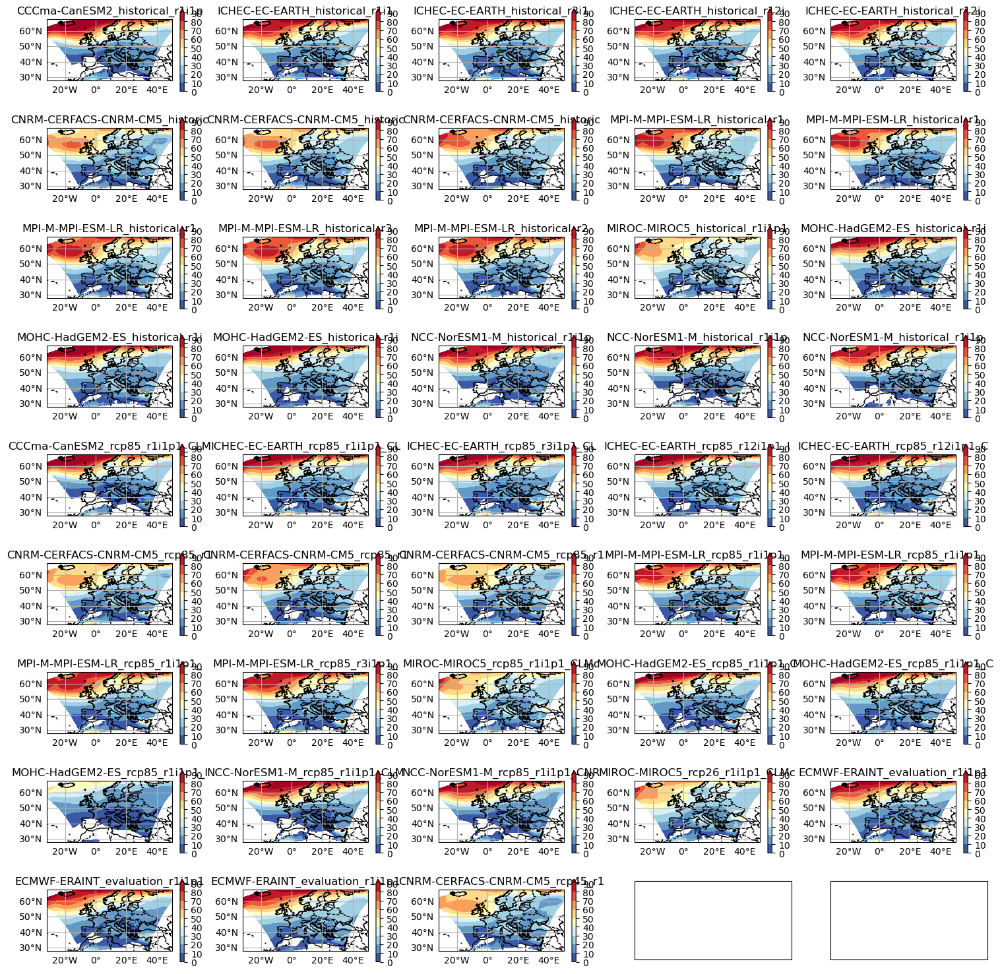

Anticyclones


/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'add_colorbar'
  result = super().contourf(*args, **kwargs)
/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


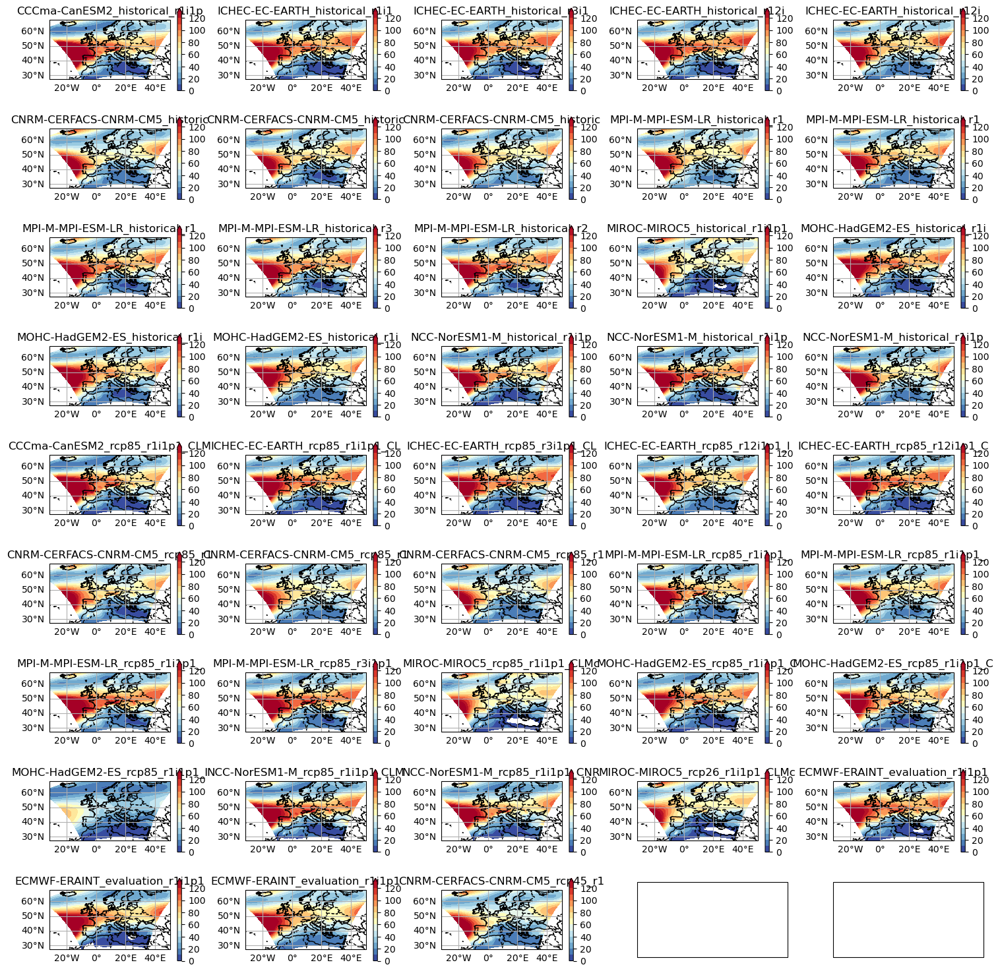

Precipitation


/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'add_colorbar'
  result = super().contourf(*args, **kwargs)
/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


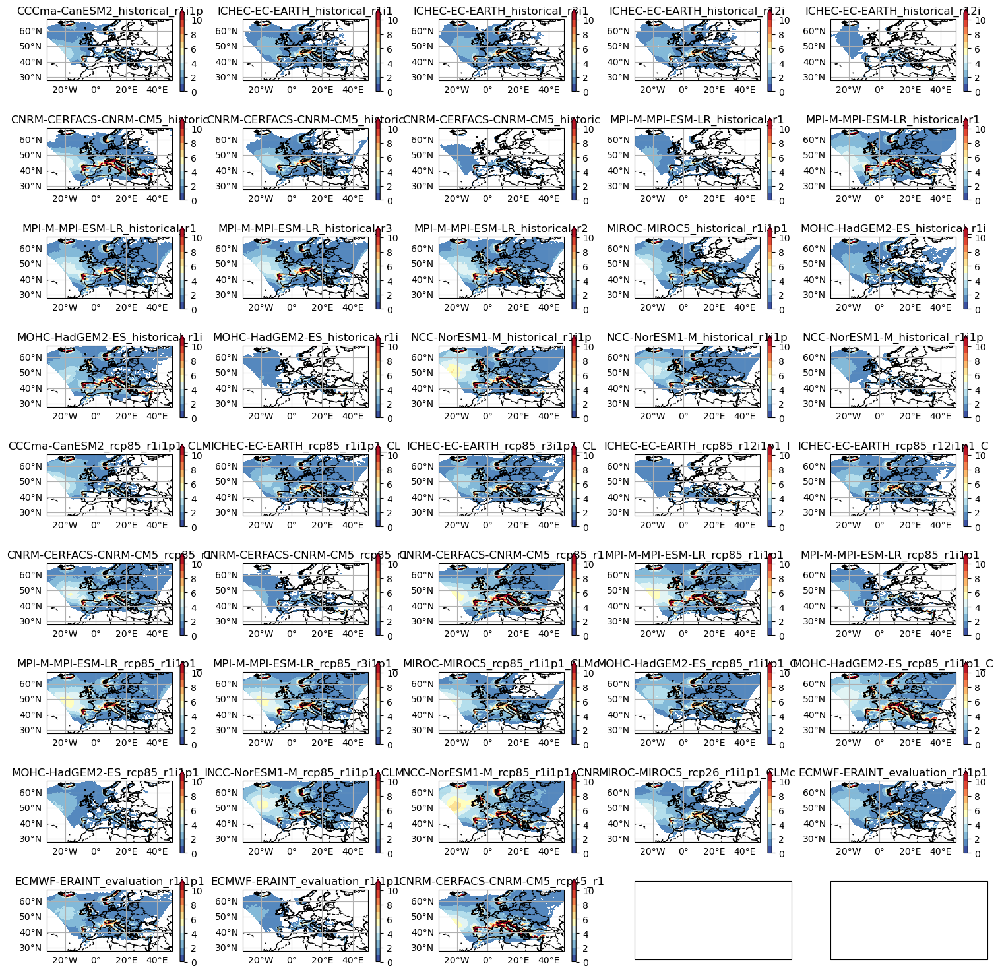

Anviles


/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'add_colorbar'
  result = super().contourf(*args, **kwargs)
/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/matplotlib/contour.py:1491: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
/glade/work/mingge

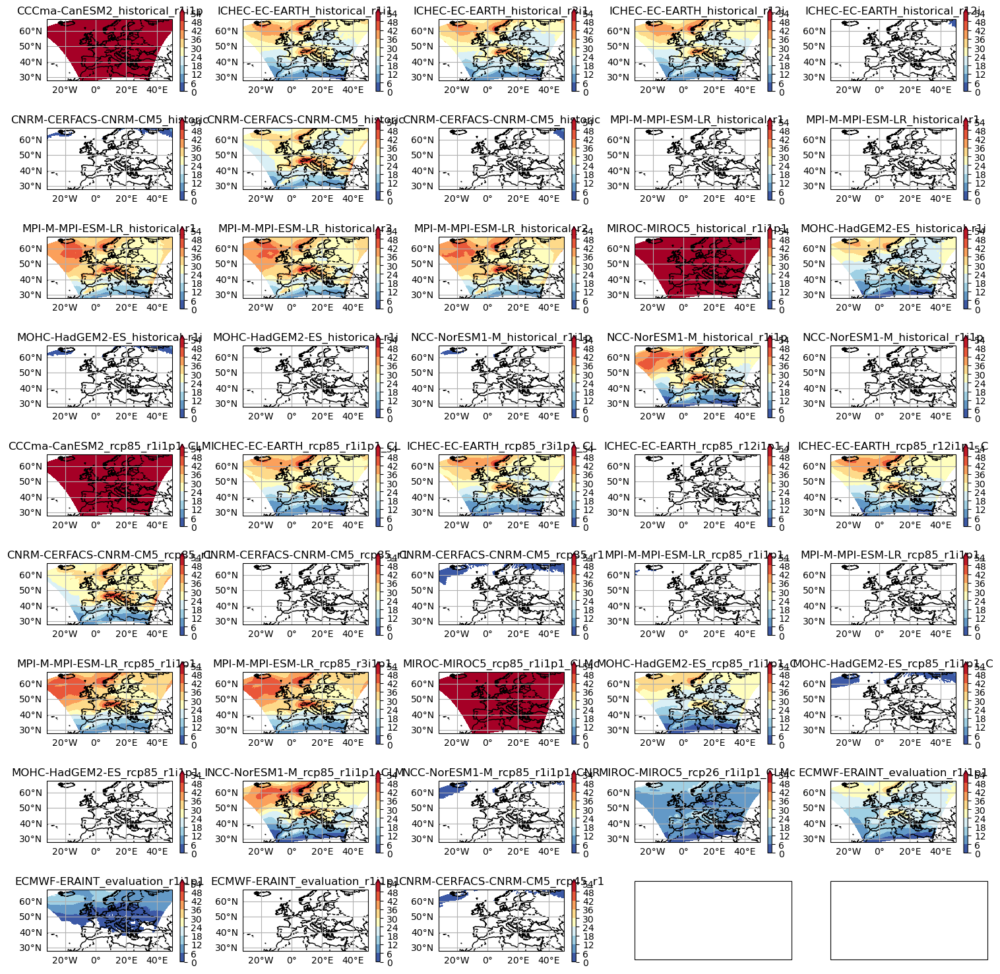

Fronts


/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'add_colorbar'
  result = super().contourf(*args, **kwargs)
/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/matplotlib/contour.py:1491: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
/glade/work/mingge

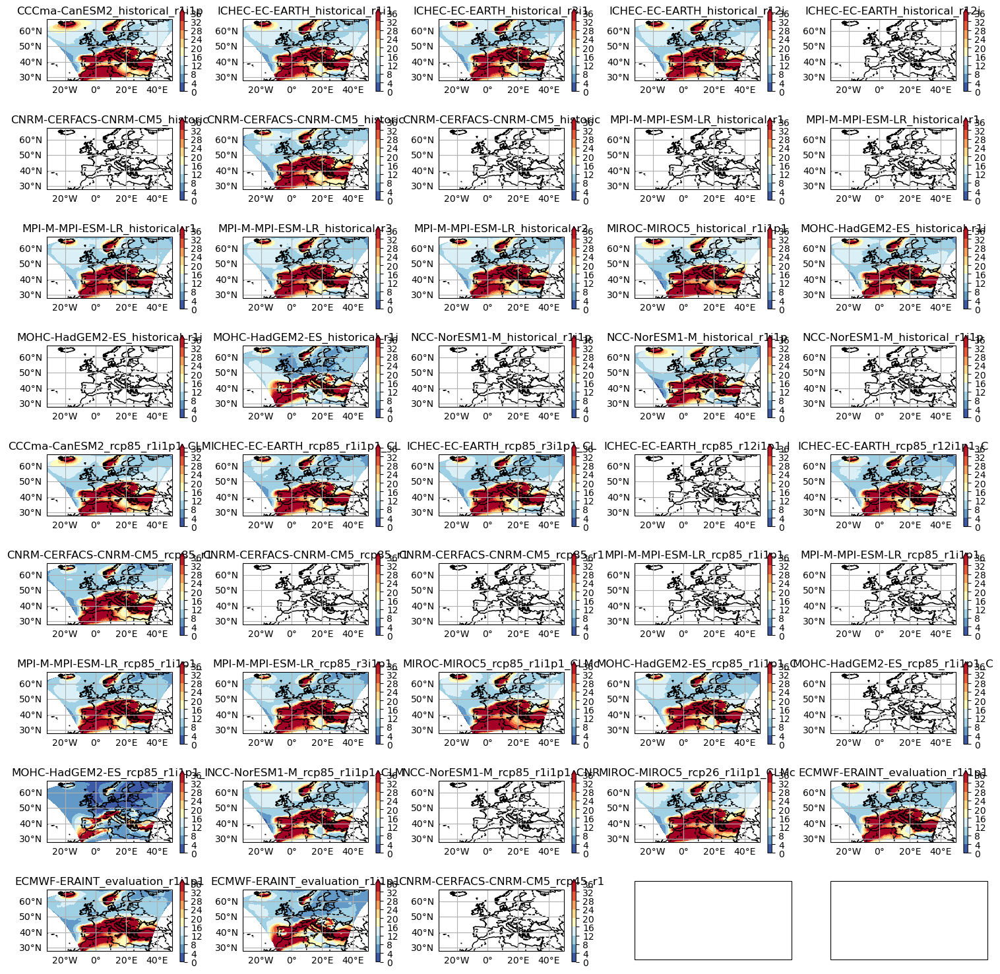

AR


/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'add_colorbar'
  result = super().contourf(*args, **kwargs)
/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/matplotlib/contour.py:1491: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
/glade/work/mingge

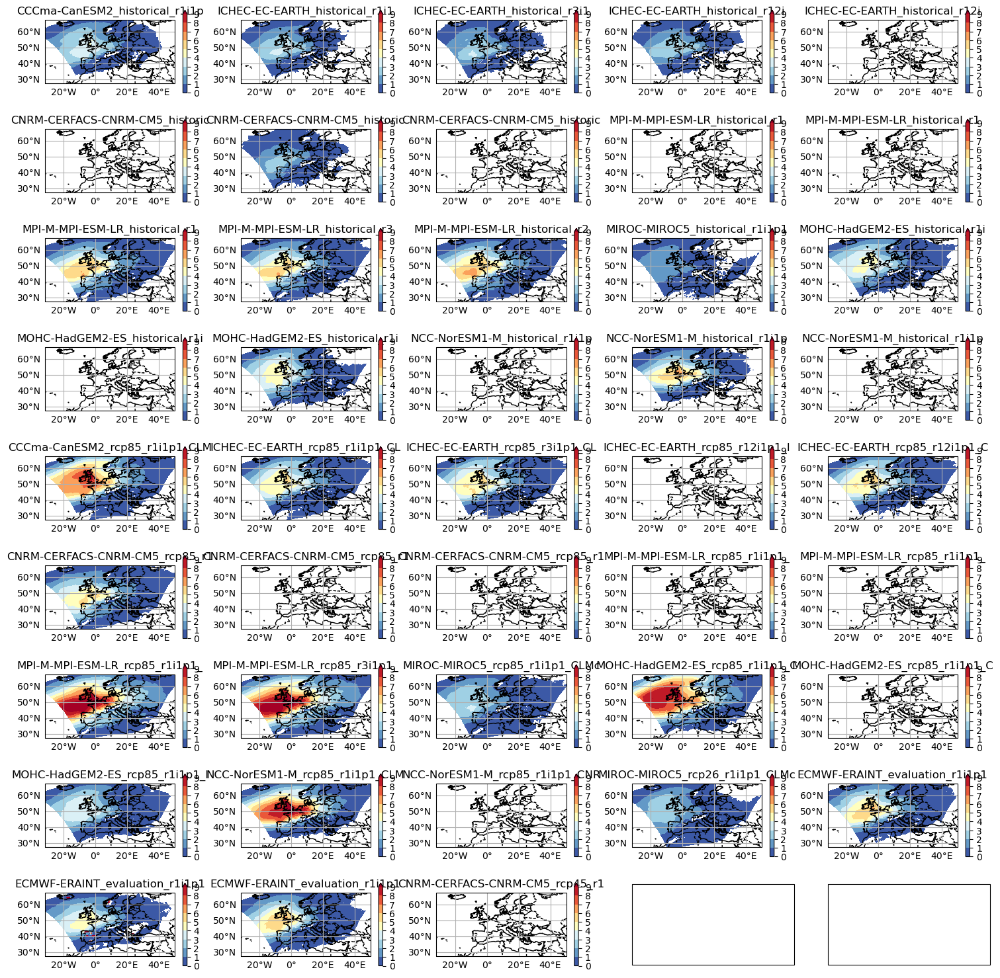

MS


/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'add_colorbar'
  result = super().contourf(*args, **kwargs)
/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/matplotlib/contour.py:1491: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
/glade/work/mingge

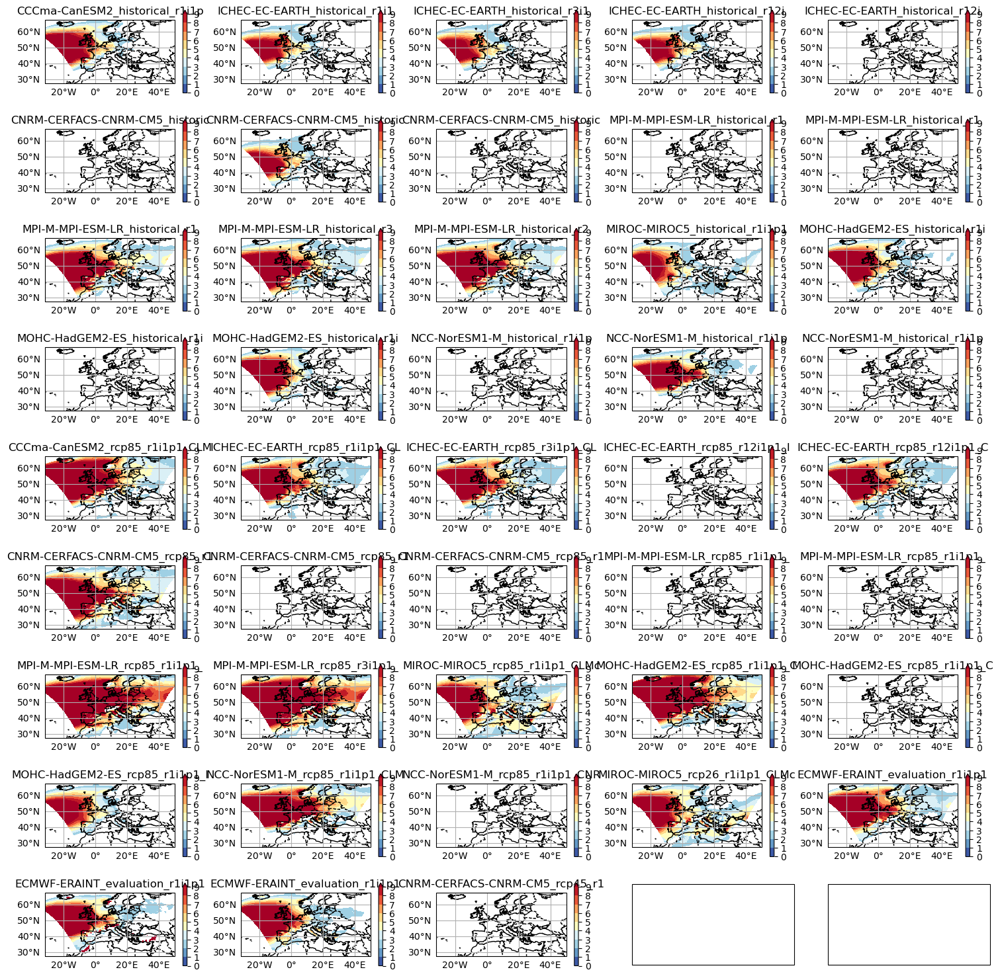

In [21]:
MIN     = [   4,         4,              1,            3,          1,    .1,   2]
Objects = ['Cyclones','Anticyclones','Precipitation','Anviles','Fronts','AR', 'MS'] 
level_s = [np.arange(0,100, 10), np.arange(0,140, 10), np.arange(0,12,1), np.arange(0, 60,6)
          ,np.arange(0,40,4),np.arange(0, 5, 0.5) ,np.arange(0, 40, 4)]
proj = ccrs.PlateCarree()

for obj in range(n_obj):
    fig, ax = plt.subplots(9, 5, subplot_kw={'projection': ccrs.PlateCarree()},figsize=(15,15))
    print(Objects[obj])
    for ds in range(n_ds):
        nr = int(ds/5)
        nc = int((ds%5))
        #print(ds,nr, nc)
        
        DATAse = ObjectFrequency[ds,:,:,Objects.index(Objects[obj])]
        DATAse[DATAse < MIN[obj]] = np.nan     
             
        im=ax[nr,nc].contourf(Lon, Lat, DATAse, transform=ccrs.PlateCarree(), 
                               add_colorbar=True,levels=level_s[obj],extend='max', cmap='RdYlBu_r')
        fig.colorbar(im, ax=ax[nr,nc], shrink=0.9)
        ax[nr,nc].coastlines()
        ax[nr,nc].add_feature(cartopy.feature.BORDERS, linestyle='--') 
        
        ax[nr][nc].set_title(dataset[ds][:30]) # fontweight='bold')#, color= 'blue')
        xl = ax[nr,nc].gridlines(draw_labels=True)  
        # remove axis label
        xl.xlabels_top = False
        xl.ylabels_right = False
         
    plt.savefig(Objects[obj] + '_' + res + '.pdf')  
    plt.tight_layout()
    plt.show()

In [8]:
### grid.44

Cyclones
Anticyclones
Precipitation
Anviles
Fronts
AR
MS


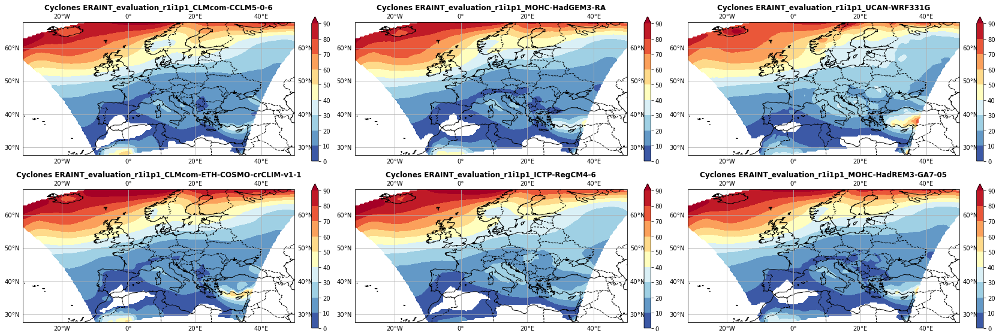

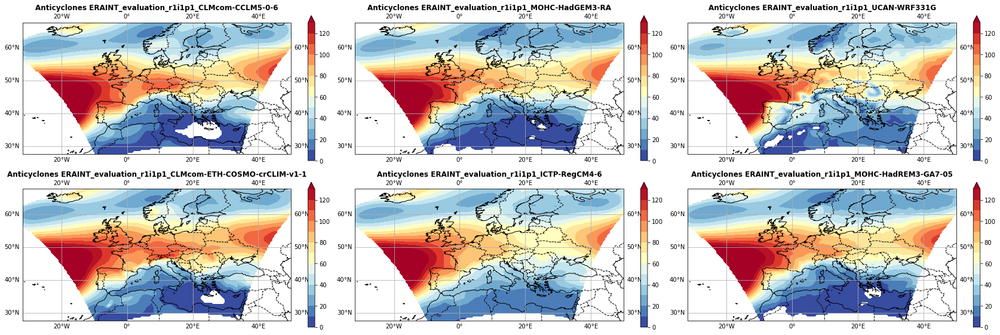

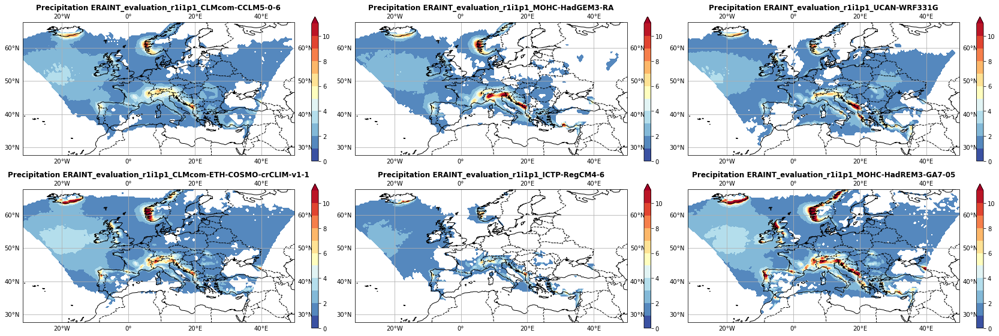

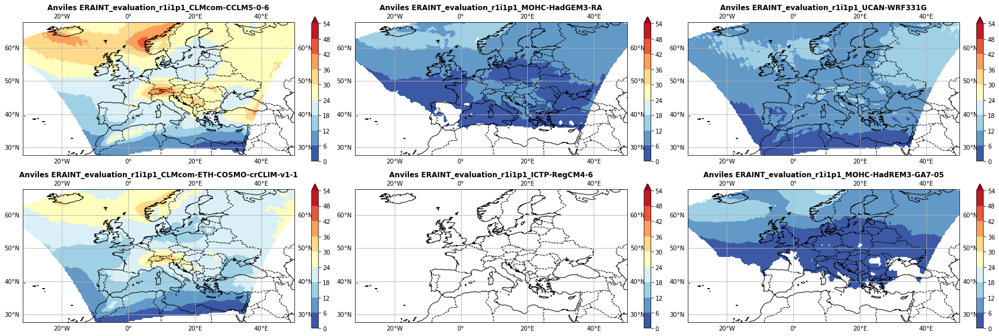

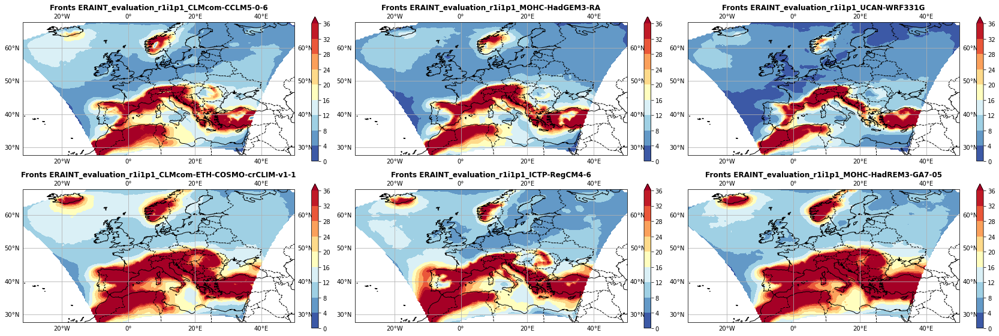

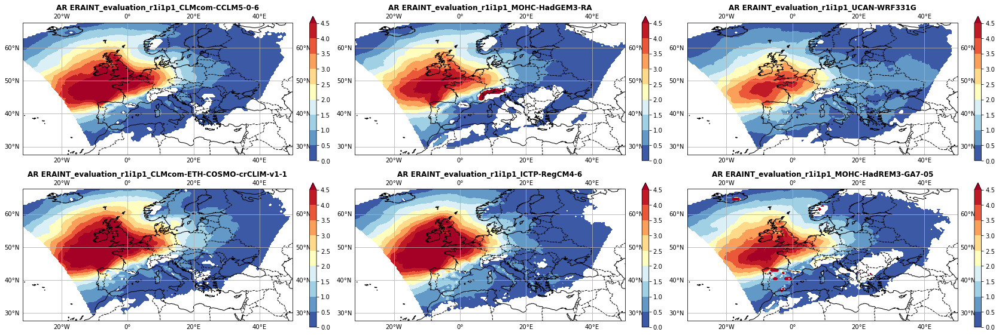

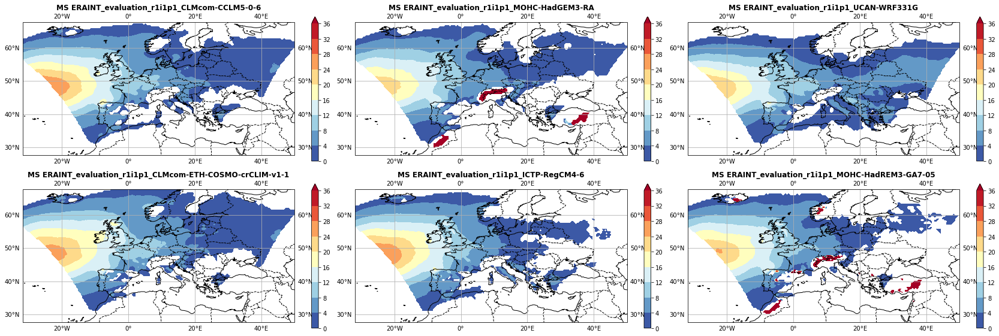

In [23]:
MIN     = [   4,         4,              1,            3,          1,    .1,   2]
Objects = ['Cyclones','Anticyclones','Precipitation','Anviles','Fronts','AR', 'MS'] 
level_s = [np.arange(0,100, 10), np.arange(0,140, 10), np.arange(0,12,1), np.arange(0, 60,6)
          ,np.arange(0,40,4),np.arange(0,5,0.5) ,np.arange(0, 40, 4)]
proj = ccrs.PlateCarree()
for obj in range( n_obj):
    fig, ax = plt.subplots(2, 3, subplot_kw={'projection': ccrs.PlateCarree()},figsize=(24,8))
    print(Objects[obj])
    for ds in range(n_ds):
        nr = int(ds/3)
        nc = int((ds%3))
        #print(ds,nr, nc)
        
        DATAse = ObjectFrequency[ds,:,:,Objects.index(Objects[obj])]
        DATAse[DATAse < MIN[obj]] = np.nan     
             
        im=ax[nr,nc].contourf(Lon, Lat, DATAse, transform=ccrs.PlateCarree(), 
                               add_colorbar=True,levels=level_s[obj],extend='max', cmap='RdYlBu_r')
        fig.colorbar(im, ax=ax[nr,nc], shrink=0.9)
        ax[nr,nc].coastlines()
        ax[nr,nc].add_feature(cartopy.feature.BORDERS, linestyle='--') 
        #ax[nr][nc].set_title(Objects[obj] + ' ' + dataset[ds])
        ax[nr][nc].set_title(Objects[obj] + " " + dataset[ds][6:], fontweight='bold')#, color= 'blue')
        xl = ax[nr,nc].gridlines(draw_labels=True)
        plt.tight_layout()
            